# Initial Species prediction for Ecuador dataset

Goal: predict if a tree belongs to the dominant species "Musacea" or not.

For Ecuador dataset, we do an initial tree species detection to refine the mapping of ground and drone data. We train a CNN model to predict from the tree canopy image, the probaility of the tree to belong to the dominant species "Musacea" (palm trees). The output probabilities are used as new features for the drone dataset, and will be used as an additional term in the cost for the Optimal Transport methods. 

For training, we give as input image patches of the trees. The labels are the species (scientific name of the trees).
The notebook first defines functions to produce patches (as numpy arrays).

In [3]:
import skimage.color
import skimage.io

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import cv2

import torch
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn as nn
torch.manual_seed

<function torch.random.manual_seed(seed)>

In [2]:
import tensorflow as tf
import numpy as np
from itertools import cycle
import rasterio
from rasterio.plot import reshape_as_raster, reshape_as_image

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score

from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, BatchNormalization, Flatten, Dropout, InputLayer, MaxPool2D
from tensorflow.keras import optimizers, models
from keras.applications.resnet50 import ResNet50
from keras.models import Model
from keras.models import Sequential
from keras import optimizers
import keras

from deepforest import deepforest
from deepforest import get_data
from deepforest import utilities
from deepforest import preprocess

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical


/anaconda3/envs/venv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/anaconda3/envs/venv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/anaconda3/envs/venv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/anaconda3/envs/venv/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:5

In [2]:
import sys
import os
package = os.path.dirname(os.getcwd())
print(package)
sys.path.append(package)
sys.path.append(package + '/utils')
sys.path
from utils.deepforest_detection import *

/Users/kenzaamara/Documents/ETH Zurich/Master/Master Thesis/code/oneforest/test



Bad key text.latex.unicode in file /anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 112 ('text.latex.unicode : False # use "ucs" and "inputenc" LaTeX packages for handling')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key savefig.frameon in file /anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 423 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.3.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key pgf.debug in file /anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 444 ('pgf.debug           : False')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/bl

In [4]:
def get_patches(path_to_img, boxes):
    # read image, based on command line filename argument;
    # read the image as grayscale from the outset
    patches = []

    image = skimage.io.imread(path_to_img)

    for index, row in boxes.iterrows():
        tree = image[int(row.ymin):int(row.ymax), int(row.xmin):int(row.xmax)]
        #plt.imshow(tree_gray, cmap=plt.get_cmap('gray'), vmin=0, vmax=1)
        #print('tree.shape',tree.shape)
        patches.append(tree.astype(object))
    #print('patches shape',len(patches))
    #patches = np.array(patches).astype(object)
    #print('patches shape',patches.shape)
    return(patches)

In [104]:
def clear(mydir):
    for f in os.listdir(mydir):
        os.remove(os.path.join(mydir, f))

def resize_patches(patches, mydir = None, name = None, save = False):
    n = len(patches)
    print(n)
    resized_patches = []
    for i in range(n):
        resized_patch = cv2.resize(np.array(patches[i], dtype = np.float32), (200, 200))
        if save == True:
            clear(mydir)
            path_save = mydir+"/patch_{}_{}.png".format(name, i)
            plt.imsave(path_save, resized_patch)
        resized_patches.append(resized_patch)
    return(np.array(resized_patches))

We choose image tiles from two sites containing Musacea trees (positives) and other trees (negatives). We extract the positives and negative patches to feed the CNN.

In [109]:
# Choose an image where there are only Musacea trees (look like a Palm) or only non-Musacea trees.
current_dir = os.getcwd()
path_to_img_pos = os.path.join(current_dir, 'images/Flora Pluas RGB/Flora Pluas RGB_6_3800_3800_7800_7800.png')
path_to_img_neg = os.path.join(current_dir, 'images/Manuel Macias RGB/Manuel Macias RGB_3_3800_0_7800_4000.png')
path_to_img_neg_2 = os.path.join(current_dir, 'images/Manuel Macias RGB/Manuel Macias RGB_9_9748_0_13748_4000.png')
path_to_img_neg_3 = os.path.join(current_dir, 'images/Manuel Macias RGB/Manuel Macias RGB_0_0_0_4000_4000.png')


In [110]:
# Get the fine-tuned deepforest to detect trees for tropical forests.
test_model = deepforest.deepforest(saved_model = os.getcwd()+'/deepforest/final_model_4000_epochs_35.h5')

Reading config file: /anaconda3/envs/venv/lib/python3.6/site-packages/deepforest/data/deepforest_config.yml
Loading saved model
tracking <tf.Variable 'Variable_10:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_11:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_12:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_13:0' shape=(9, 4) dtype=float32> anchors
tracking <tf.Variable 'Variable_14:0' shape=(9, 4) dtype=float32> anchors


In [111]:
# Detect trees and extract patches (image of the canopy for each tree)
boxes_pos = get_annotations(path_to_img_pos, test_model)
patches_pos = get_patches(path_to_img_pos, boxes_pos)    

boxes_neg = get_annotations(path_to_img_neg, test_model)
patches_neg = get_patches(path_to_img_neg, boxes_neg)

boxes_neg_2 = get_annotations(path_to_img_neg_2, test_model)
patches_neg_2 = get_patches(path_to_img_neg_2, boxes_neg_2) 
                               
boxes_neg_3 = get_annotations(path_to_img_neg_3, test_model)
patches_neg_3 = get_patches(path_to_img_neg_3, boxes_neg_3) 

patches_neg = np.concatenate((patches_neg, patches_neg_2, patches_neg_3), axis=0)

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [112]:
n_pos = len(patches_pos)
n_neg = len(patches_neg)
n_pos, n_neg

(163, 237)

In [113]:
# Directory with our training musacea pictures
musacea_dir = os.path.join('cnn/train_hand/musacea')

# Directory with our training non-musacea pictures
other_dir = os.path.join('cnn/train_hand/other')

In [115]:
# Resize patches to have similar shapes (200, 200)
patches_pos = resize_patches(np.array(patches_pos), musacea_dir, name = 'pos', save = False)
patches_neg = resize_patches(np.array(patches_neg), other_dir, name = 'neg', save = False)

np.save('cnn/train_hand/patches_pos.npy', patches_pos)
np.save('cnn/train_hand/patches_neg.npy', patches_neg)

In [51]:
# Include labels
y_pos = np.array([0]*n_pos)
y_neg = np.array([1]*n_neg)

X = np.concatenate((patches_pos, patches_neg), axis=0)
y = np.concatenate((y_pos, y_neg), axis=0)

randomize = np.arange(len(X))
np.random.shuffle(randomize)
X = X[randomize]
y = y[randomize]

print(X.shape)
print(y.shape)

(400, 200, 200, 3)
(400,)


In [53]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.20, random_state = 2)

In [55]:
#CNN model

from tensorflow.keras.preprocessing.image import ImageDataGenerator

# All images will be rescaled by 1./255
train_musacea = ImageDataGenerator(rescale=1/255)
validation_musacea = ImageDataGenerator(rescale=1/255)

# Flow training images in batches of 120 using train_datagen generator
train_generator = train_musacea.flow( X_train, y_train, # All images will be resized to 200x200
        batch_size=256)

# Flow validation images in batches of 19 using valid_datagen generator
validation_generator = validation_musacea.flow(X_val, y_val,  # All images will be resized to 200x200
        batch_size=60,
        shuffle=False)

In [56]:
IMG_SIZE = 200


model = Sequential()
model.add(Conv2D(64, kernel_size=6, activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization(momentum=0.01))

model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization(momentum=0.01))

model.add(Conv2D(32, kernel_size=3, activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization(momentum=0.01))

model.add(Conv2D(32, kernel_size=3, activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization(momentum=0.01))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [57]:
model.compile(optimizer = 'rmsprop',
              loss = 'binary_crossentropy',
              metrics=['accuracy'])

In [58]:
history = model.fit(train_generator,  
      epochs=3,
      verbose=1,
      validation_data = validation_generator)

Epoch 1/3
2/2 [==============================] - 52s 26s/step - loss: 1.4119 - accuracy: 0.5656 - val_loss: 8.3144 - val_accuracy: 0.6375
Epoch 2/3
2/2 [==============================] - 47s 23s/step - loss: 1.1531 - accuracy: 0.6844 - val_loss: 1.8988 - val_accuracy: 0.6250
Epoch 3/3
2/2 [==============================] - 47s 24s/step - loss: 0.5830 - accuracy: 0.8750 - val_loss: 0.2402 - val_accuracy: 0.9125


In [61]:
model.evaluate(validation_generator)

2/2 [==============================] - 2s 1s/step


[0.24021759629249573, 0.9125000238418579]

[[0.09790328]
 [0.63366395]
 [0.45319727]
 [0.14227483]
 [0.15735444]
 [0.73943913]
 [0.03955323]
 [0.12618035]
 [0.20168144]
 [0.33685338]
 [0.5012636 ]
 [0.32374   ]
 [0.16391152]
 [0.21808496]
 [0.31388015]
 [0.00564894]
 [0.317532  ]
 [0.01546872]
 [0.8643086 ]
 [0.0251298 ]
 [0.06698895]
 [0.1838117 ]
 [0.38025352]
 [0.24067861]
 [0.06313851]
 [0.00745293]
 [0.01647925]
 [0.37539193]
 [0.04562959]
 [0.01349139]
 [0.0370397 ]
 [0.11973706]
 [0.03276673]
 [0.01271144]
 [0.08961743]
 [0.03114691]
 [0.03341028]
 [0.18866876]
 [0.24467337]
 [0.00203475]
 [0.11221445]
 [0.06978771]
 [0.09416947]
 [0.00981328]
 [0.20313409]
 [0.48336688]
 [0.16328171]
 [0.01610321]
 [0.06624752]
 [0.05997241]
 [0.13128027]
 [0.08806106]
 [0.18497187]
 [0.7998537 ]
 [0.43571633]
 [0.20100403]
 [0.15136713]
 [0.03023562]
 [0.18800914]
 [0.0369426 ]
 [0.01658669]
 [0.24399644]
 [0.01745066]
 [0.0021663 ]
 [0.04835096]
 [0.06601584]
 [0.08009592]
 [0.00566089]
 [0.26988328]
 [0.12964186]
 [0.07092783]
 [0.01

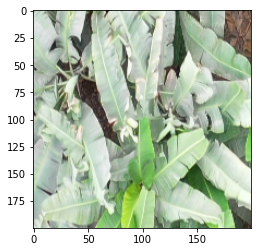

label is:  0
class is:  [0.09790328]


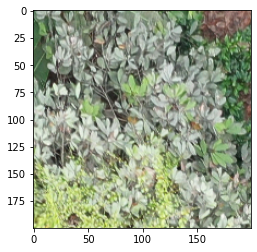

label is:  1
class is:  [0.63366395]


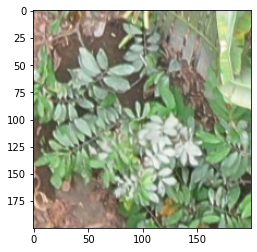

label is:  1
class is:  [0.45319727]


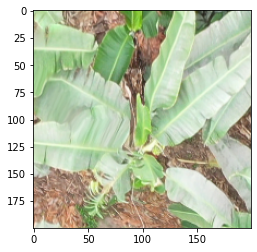

label is:  0
class is:  [0.14227483]


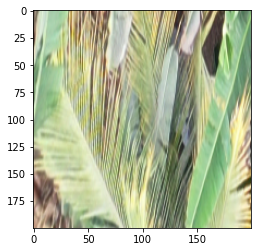

label is:  1
class is:  [0.15735444]


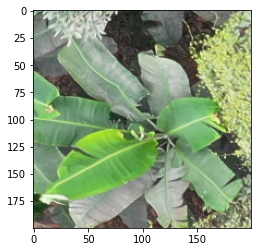

label is:  0
class is:  [0.73943913]


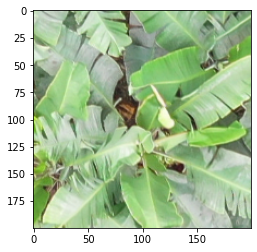

label is:  0
class is:  [0.03955323]


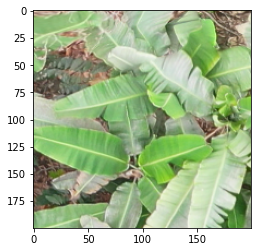

label is:  0
class is:  [0.12618035]


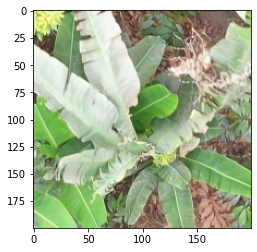

label is:  0
class is:  [0.20168144]


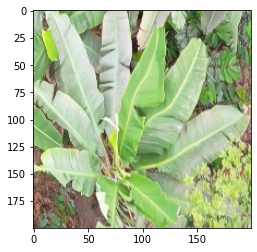

label is:  0
class is:  [0.33685338]


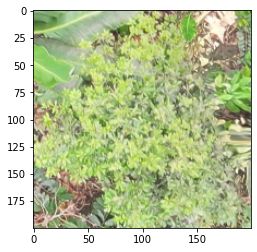

label is:  1
class is:  [0.5012636]


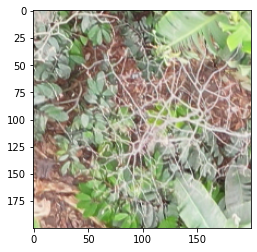

label is:  1
class is:  [0.32374]


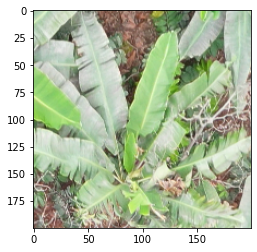

label is:  0
class is:  [0.16391152]


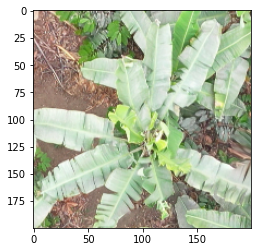

label is:  0
class is:  [0.21808496]


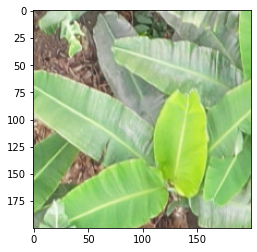

label is:  0
class is:  [0.31388015]


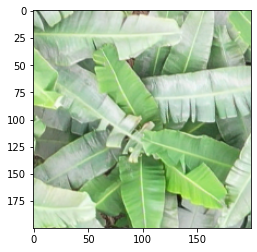

label is:  0
class is:  [0.00564894]


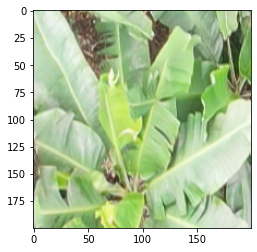

label is:  0
class is:  [0.317532]


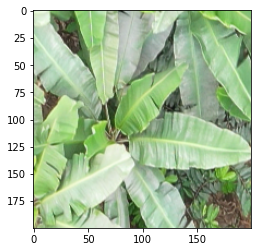

label is:  0
class is:  [0.01546872]


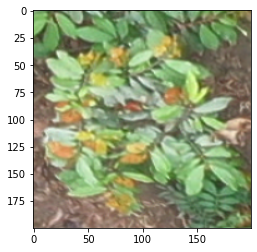

label is:  1
class is:  [0.8643086]


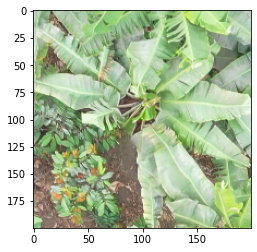

label is:  0
class is:  [0.0251298]


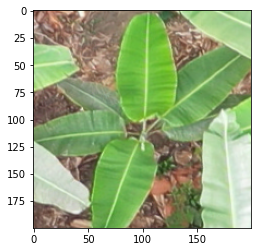

label is:  0
class is:  [0.06698895]


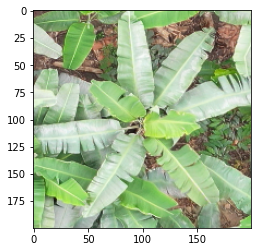

label is:  0
class is:  [0.1838117]


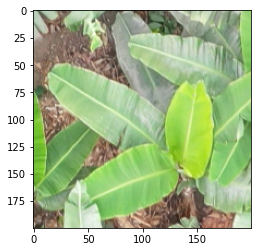

label is:  0
class is:  [0.38025352]


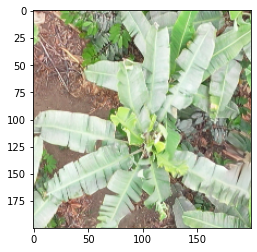

label is:  0
class is:  [0.24067861]


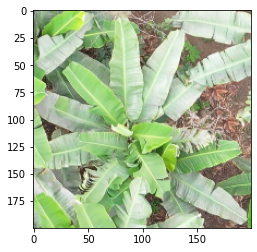

label is:  0
class is:  [0.06313851]


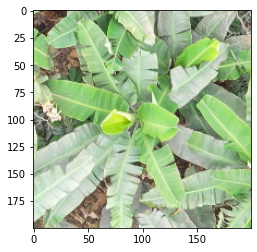

label is:  0
class is:  [0.00745293]


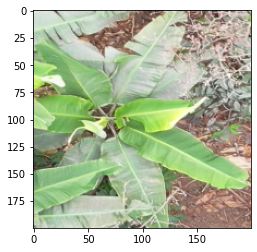

label is:  0
class is:  [0.01647925]


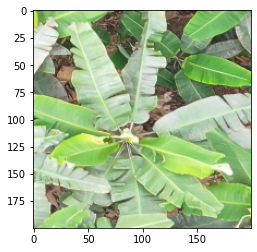

label is:  0
class is:  [0.37539193]


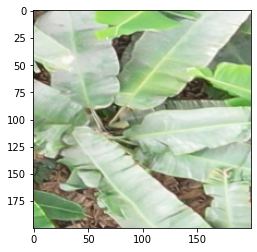

label is:  0
class is:  [0.04562959]


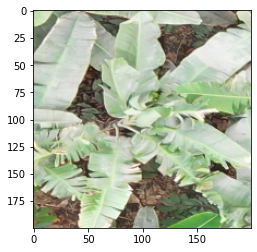

label is:  0
class is:  [0.01349139]


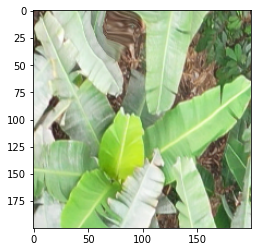

label is:  0
class is:  [0.0370397]


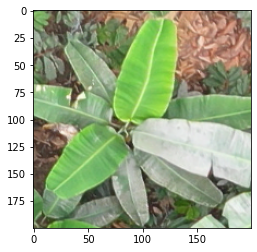

label is:  0
class is:  [0.11973706]


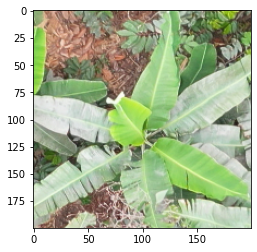

label is:  0
class is:  [0.03276673]


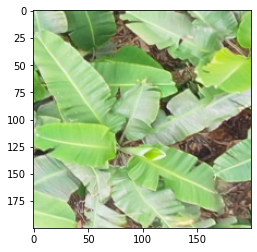

label is:  0
class is:  [0.01271144]


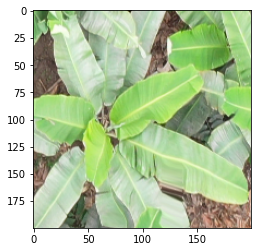

label is:  0
class is:  [0.08961743]


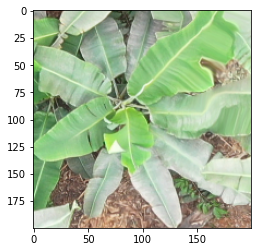

label is:  0
class is:  [0.03114691]


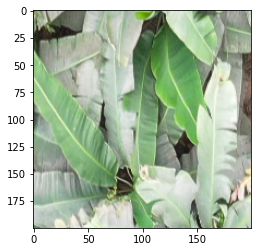

label is:  0
class is:  [0.03341028]


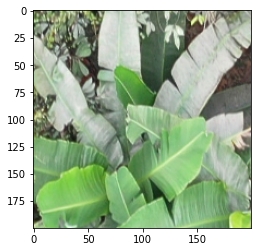

label is:  0
class is:  [0.18866876]


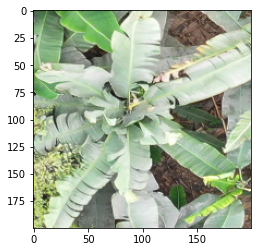

label is:  0
class is:  [0.24467337]


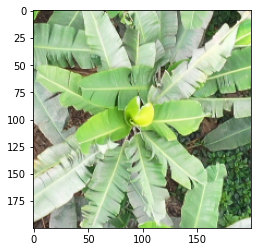

label is:  0
class is:  [0.00203475]


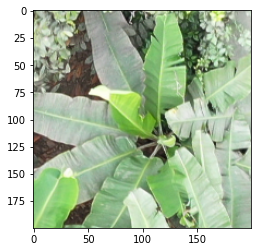

label is:  0
class is:  [0.11221445]


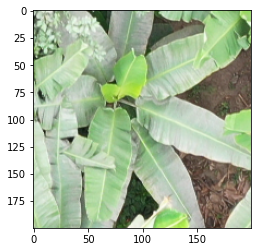

label is:  0
class is:  [0.06978771]


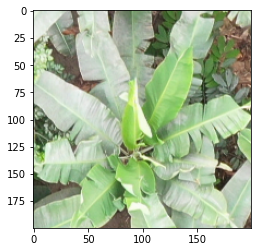

label is:  0
class is:  [0.09416947]


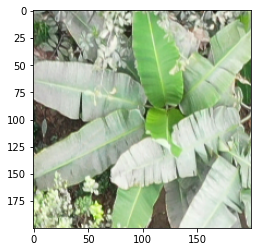

label is:  0
class is:  [0.00981328]


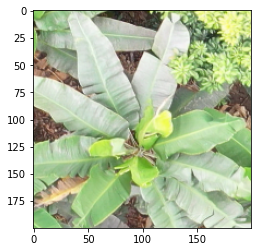

label is:  0
class is:  [0.20313409]


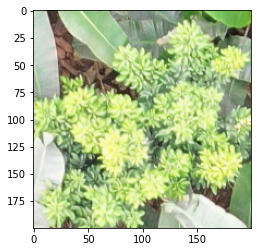

label is:  1
class is:  [0.48336688]


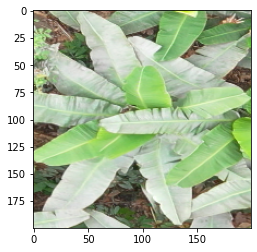

label is:  0
class is:  [0.16328171]


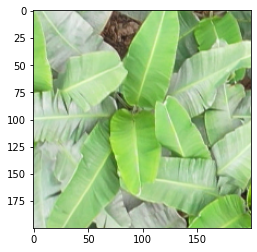

label is:  0
class is:  [0.01610321]


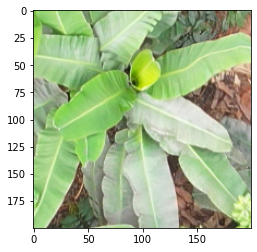

label is:  0
class is:  [0.06624752]


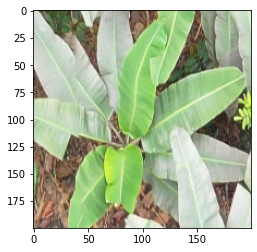

label is:  0
class is:  [0.05997241]


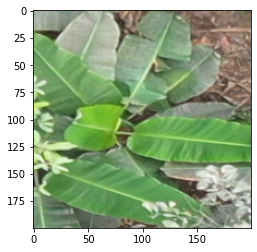

label is:  0
class is:  [0.13128027]


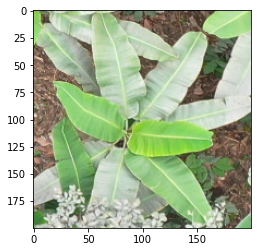

label is:  0
class is:  [0.08806106]


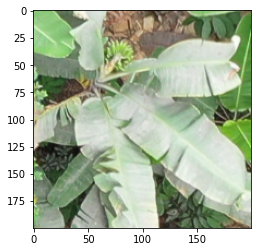

label is:  0
class is:  [0.18497187]


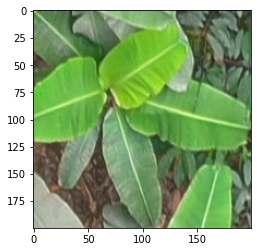

label is:  0
class is:  [0.7998537]


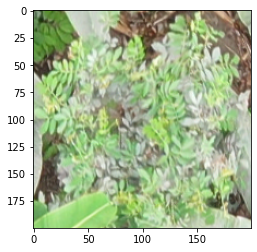

label is:  1
class is:  [0.43571633]


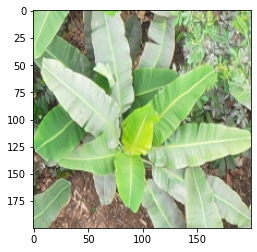

label is:  0
class is:  [0.20100403]


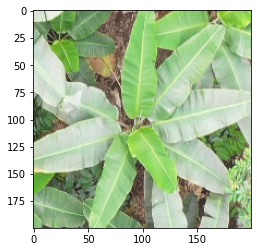

label is:  0
class is:  [0.15136713]


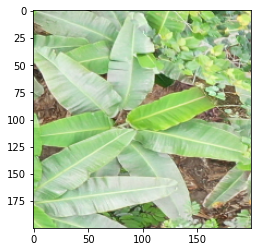

label is:  0
class is:  [0.03023562]


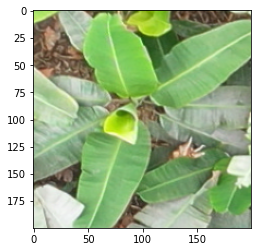

label is:  0
class is:  [0.18800914]


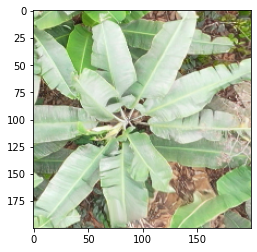

label is:  0
class is:  [0.0369426]


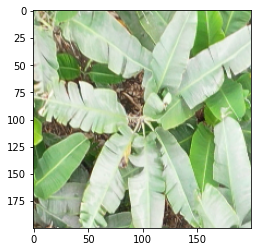

label is:  0
class is:  [0.01658669]


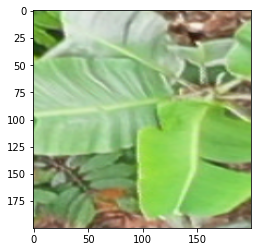

label is:  0
class is:  [0.24399644]


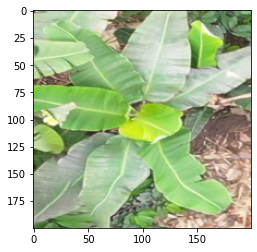

label is:  0
class is:  [0.01745066]


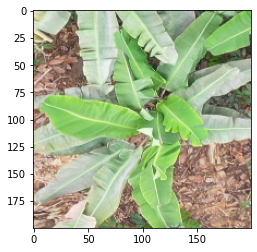

label is:  0
class is:  [0.0021663]


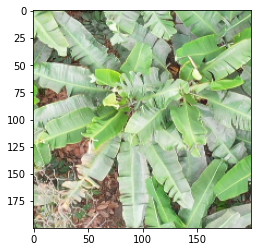

label is:  0
class is:  [0.04835096]


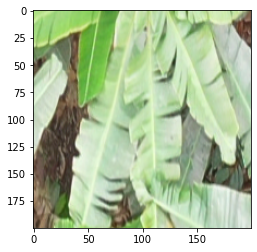

label is:  0
class is:  [0.06601584]


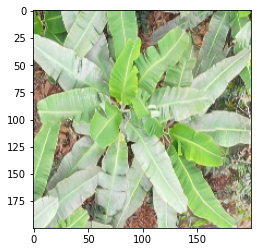

label is:  0
class is:  [0.08009592]


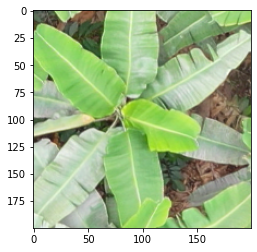

label is:  0
class is:  [0.00566089]


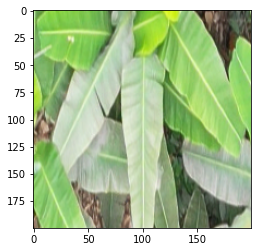

label is:  0
class is:  [0.26988328]


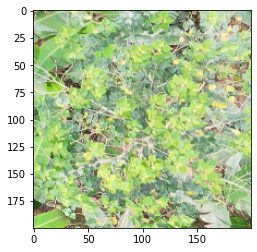

label is:  1
class is:  [0.12964186]


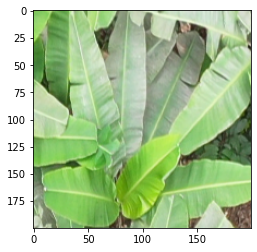

label is:  0
class is:  [0.07092783]


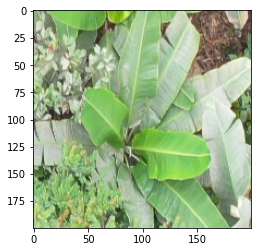

label is:  0
class is:  [0.01496154]


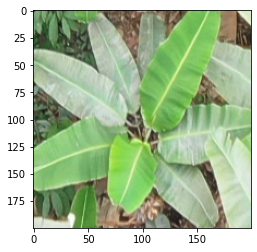

label is:  0
class is:  [0.26538563]


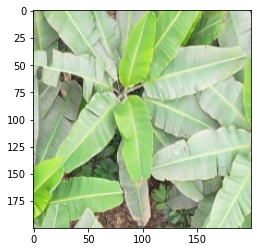

label is:  0
class is:  [0.03810164]


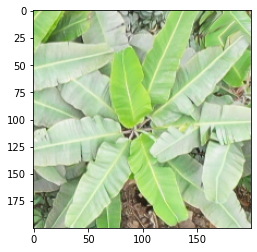

label is:  0
class is:  [0.06496462]


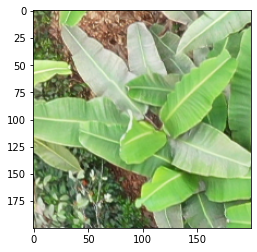

label is:  0
class is:  [0.33749527]


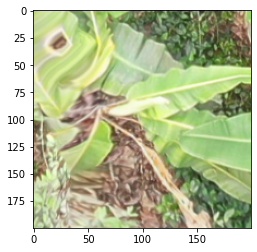

label is:  0
class is:  [0.28400964]


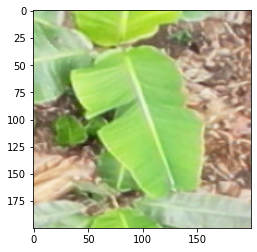

label is:  0
class is:  [0.03118643]


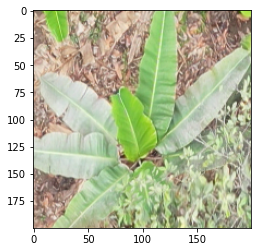

label is:  0
class is:  [0.14394712]


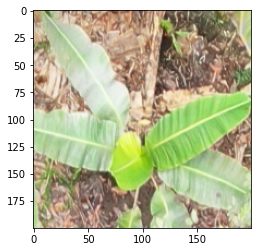

label is:  0
class is:  [0.4410181]


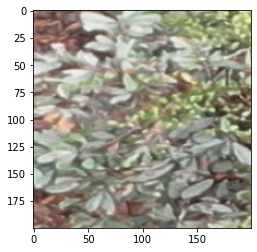

label is:  1
class is:  [0.29472548]


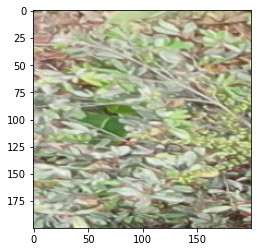

label is:  1
class is:  [0.1455706]


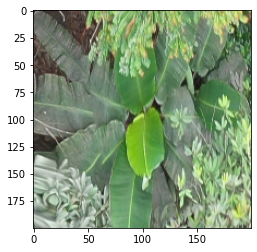

label is:  0
class is:  [0.7499135]


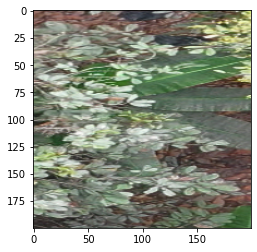

label is:  1
class is:  [0.89658076]


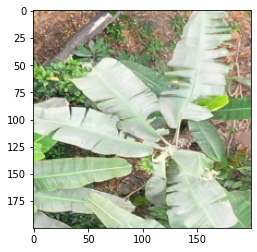

label is:  0
class is:  [0.21811]


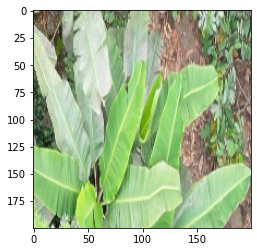

label is:  0
class is:  [0.02726558]


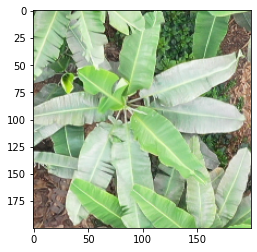

label is:  0
class is:  [0.07667848]


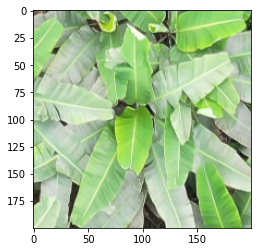

label is:  0
class is:  [0.34886032]


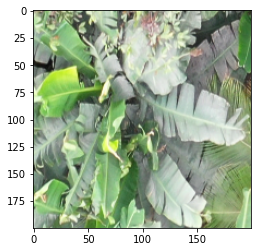

label is:  0
class is:  [0.12182334]


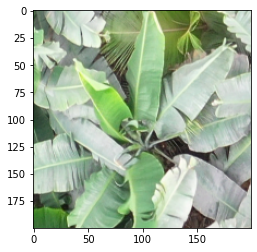

label is:  0
class is:  [0.00765857]


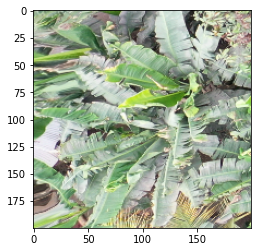

label is:  0
class is:  [0.18268514]


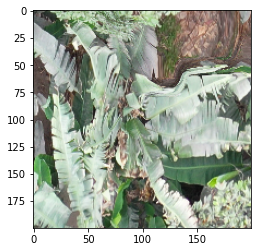

label is:  0
class is:  [0.1261105]


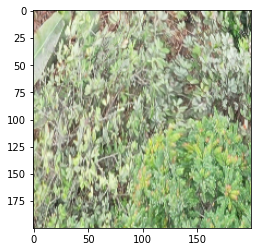

label is:  1
class is:  [0.42152026]


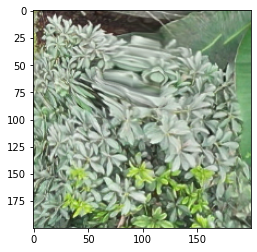

label is:  1
class is:  [0.99895763]


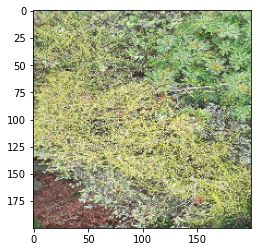

label is:  1
class is:  [0.9687421]


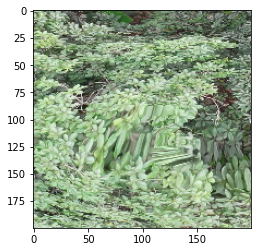

label is:  1
class is:  [0.99999976]


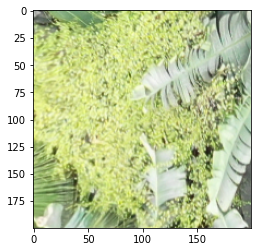

label is:  1
class is:  [0.47169012]


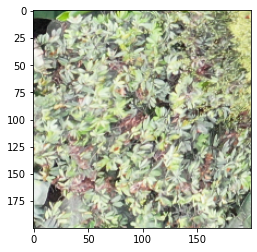

label is:  1
class is:  [0.50711095]


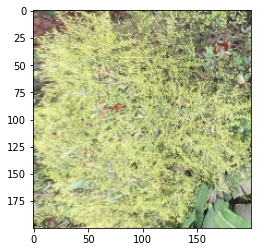

label is:  1
class is:  [0.43348294]


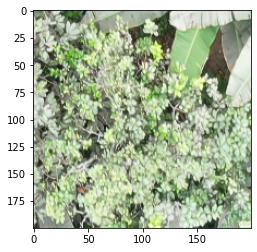

label is:  1
class is:  [0.9982364]


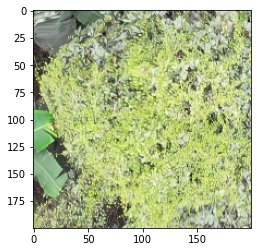

label is:  1
class is:  [0.19472253]


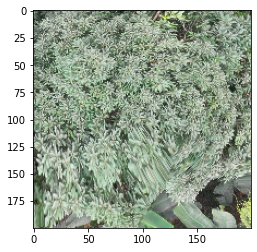

label is:  1
class is:  [0.999995]


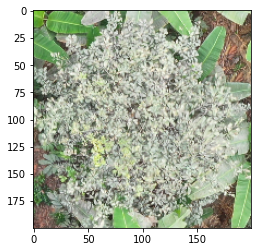

label is:  1
class is:  [0.6631372]


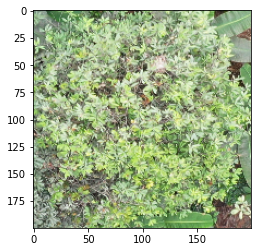

label is:  1
class is:  [0.9957036]


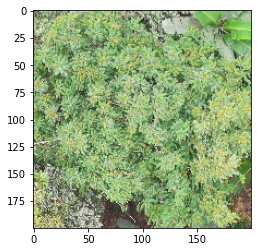

label is:  1
class is:  [0.9999341]
Accuracy for CNN model trained on 400 Handlabeled patches, tested on 105 Handlabeled patches:  0.8571428571428571


In [67]:
X_test = np.load('cnn/test/patches.npy')
y_true = np.load('cnn/test/labels.npy')
y_true = y_true.astype(int)

classes = model.predict(X_test/255)
print(classes)

for i in range(len(X_test)):
    plt.imshow(X_test[i])
    plt.show()
    print('label is: ', y_true[i])
    print('class is: ', classes[i])
    
y_pred = classes.round()

print('Accuracy for CNN model trained on 400 Handlabeled patches, tested on 105 Handlabeled patches: ', accuracy_score(y_true, y_pred))

In [132]:
model.save('cnn/model')